In [18]:
import cv2               as cv
import urllib
import numpy             as np
import pandas            as pd
import seaborn           as sns
import random
import os
import glob
import shutil
from imutils        import paths
import matplotlib.pyplot as plt
from sklearn.utils  import shuffle
from urllib.request import urlopen
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models              import Sequential
from tensorflow.keras.preprocessing       import image
from tensorflow.keras.utils               import to_categorical
from tensorflow.keras.callbacks           import ModelCheckpoint,EarlyStopping
from tensorflow.keras.layers              import Conv2D,Flatten,MaxPooling2D,Dense,Dropout,SpatialDropout2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator,img_to_array,load_img,array_to_img

## 1-) Data Preparation

Data Preprocessing + Data Augmentation

In [2]:
folder_path = "Dataset\Dataset_Reorganized_240p"

target_size = (240,426)

nut_labels = {"Almond_noShell"          :0,
              "Almond_withShell"        :1,
              "Hazelnut_noShell"        :2,
              "Hazelnut_withShell"      :3,
              "Peanut_noShell_noSkin"   :4,
              "Peanut_noShell_withSkin" :5,
              "Peanut_withShell"        :6,
              "Pistachio_noShell"       :7,
              "Pistachio_withShell"     :8,
              "SunflowerSeed_noShell"   :9,
              "SunflowerSeed_withShell" :10,
              "Walnut_noShell"          :11,
              "Walnut_withShell"        :12}

### Test-Train-Validation Split

In [9]:
#import os
#import shutil
#from sklearn.model_selection import train_test_split
#
##Folders
#original_dataset_folder = 'Dataset/Dataset_Reorganized_240p'
#base_folder = 'Dataset/Dataset_Split_240p'
#os.makedirs(base_folder, exist_ok=True)
##Create Folders
#train_folder = os.path.join(base_folder, 'train')
#os.makedirs(train_folder, exist_ok=True)
#test_folder = os.path.join(base_folder, 'test')
#os.makedirs(test_folder, exist_ok=True)
##Create Class folders
#classes = os.listdir(original_dataset_folder)
#for class_ in classes:
#    os.makedirs(os.path.join(train_folder, class_), exist_ok=True)
#    os.makedirs(os.path.join(test_folder, class_), exist_ok=True)
##Copy images
#for class_ in classes:
#    src_folder = os.path.join(original_dataset_folder, class_)
#    all_filenames = os.listdir(src_folder)
#    # 80% train - 20% test
#    train_filenames, test_filenames = train_test_split(all_filenames, test_size=0.2, random_state=42)
#    # Copy
#    for filename in train_filenames:
#        shutil.copy(os.path.join(src_folder, filename), os.path.join(train_folder, class_, filename))
#    for filename in test_filenames:
#        shutil.copy(os.path.join(src_folder, filename), os.path.join(test_folder, class_, filename))

In [3]:
# Data augmentation is only for train set.
train_datagen = ImageDataGenerator(rescale            = 1.0/255, #Normalize to 0-1
                                   horizontal_flip    = True,    #Random horizontal flip
                                   vertical_flip      = True,    #Random vertical flip
                                   zoom_range         = 0.1,     #Random zoom
                                   width_shift_range  = 0.1,     #Random shift
                                   height_shift_range = 0.1,     #Random shift
                                   validation_split   = 0.125)   #10% for validation set
#Normalization for test and validaton sets.
test_datagen  = ImageDataGenerator(rescale = 1.0/255)

In [6]:
# Generators for sets

train_generator = train_datagen.flow_from_directory(directory='Dataset/Dataset_Split_240p/train',         #Train images
                                                    target_size=(240, 426),                               #size of images
                                                    batch_size=64,                                        #Mini-batch size
                                                    class_mode='categorical',
                                                    subset='training',
                                                    shuffle=True)                                         #Shuffle for every epoch

val_generator   = train_datagen.flow_from_directory(directory='Dataset/Dataset_Split_240p/train',         #Validation images
                                                   target_size=(240, 426),                                #size of images
                                                   batch_size=64,                                         #Mini-batch size
                                                   class_mode='categorical', 
                                                   subset='validation')

test_generator  = test_datagen.flow_from_directory(directory='Dataset/Dataset_Split_240p/test',           #Test images
                                                   target_size=(240, 426),                                #size of images
                                                   batch_size=64,                                         #Mini-batch size
                                                   class_mode='categorical',
                                                   shuffle=False)                                         #During the final evaluation, 
                                                                                                          # analysis must be performed 
                                                                                                          # in a fixed order.

Found 20014 images belonging to 13 classes.
Found 2855 images belonging to 13 classes.
Found 5725 images belonging to 13 classes.


## 2-) Data Visualization

------------Train Set------------


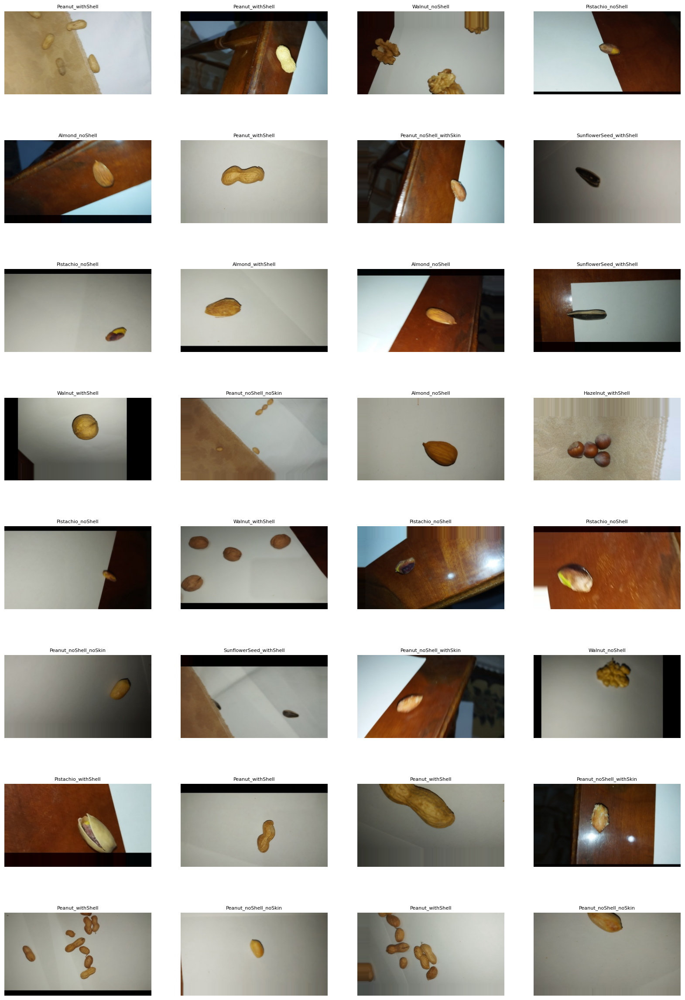

------------Validation Set------------


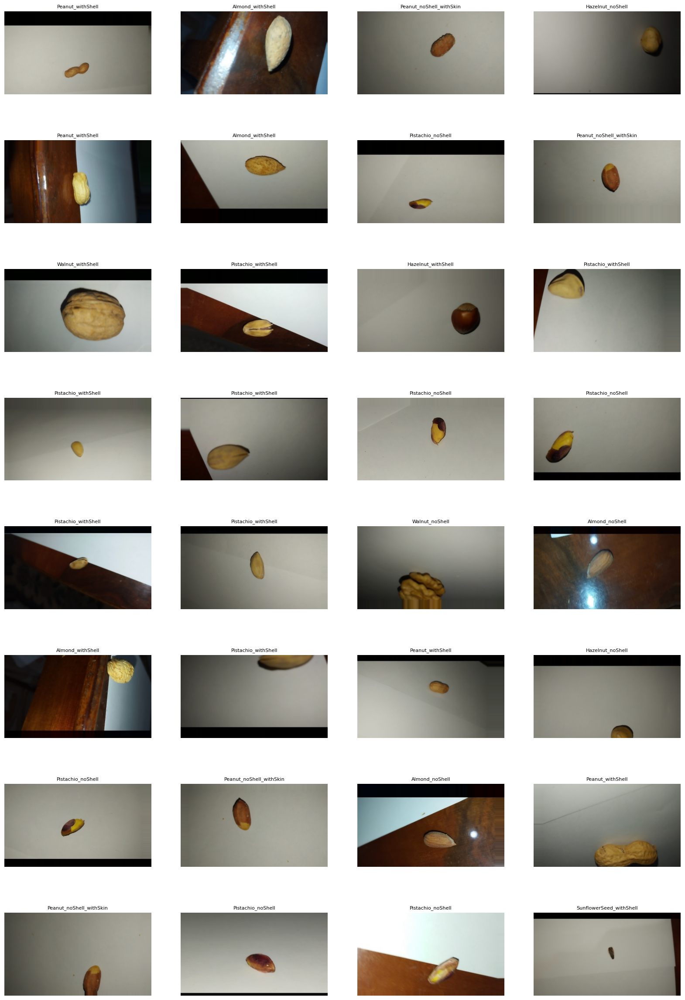

------------Test Set------------


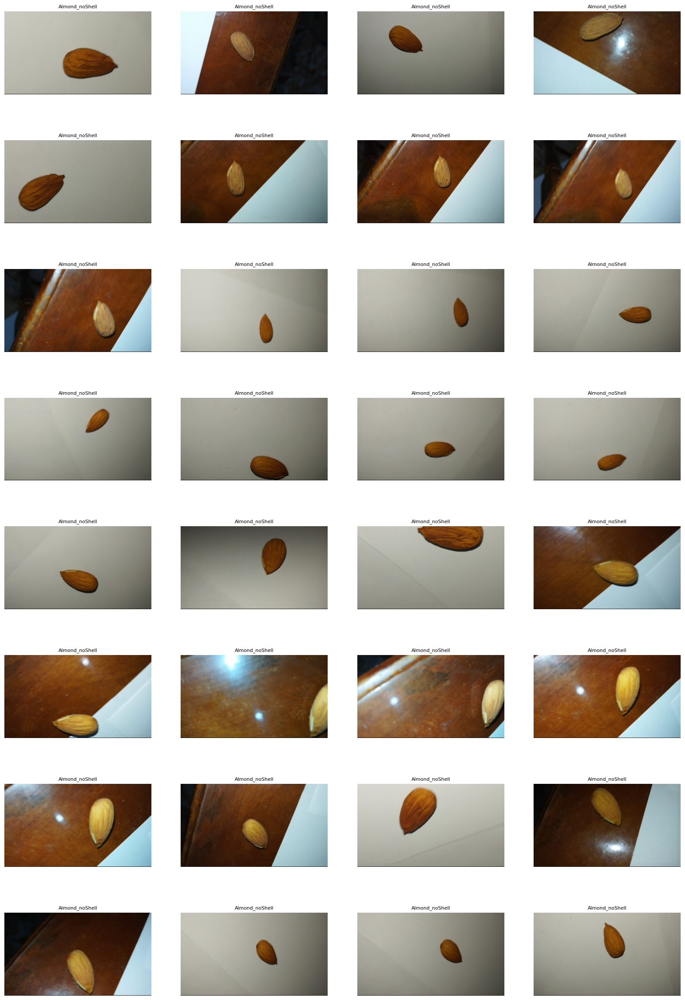

In [8]:
def visualize_image(generator, num_images=100):
    reverse_labels = {v: k for k, v in nut_labels.items()}
    image_batch, label_batch = next(generator)
    
    plt.figure(figsize=(20, 30))
    for n in range(min(num_images, len(image_batch))):
        ax = plt.subplot(8, 4, n + 1)
        
        # rescale to 0-255
        img_rescaled = (image_batch[n] * 255).astype('uint8')
        plt.imshow(img_rescaled)
        
        # Show Labels
        class_index = np.argmax(label_batch[n])
        class_name = reverse_labels[class_index]
        plt.title(class_name, fontsize=8)
        plt.axis("off")
    plt.show()

print("------------Train Set------------")
visualize_image(train_generator, num_images=32)

print("------------Validation Set------------")
visualize_image(val_generator, num_images=32)

print("------------Test Set------------")
visualize_image(test_generator, num_images=32)


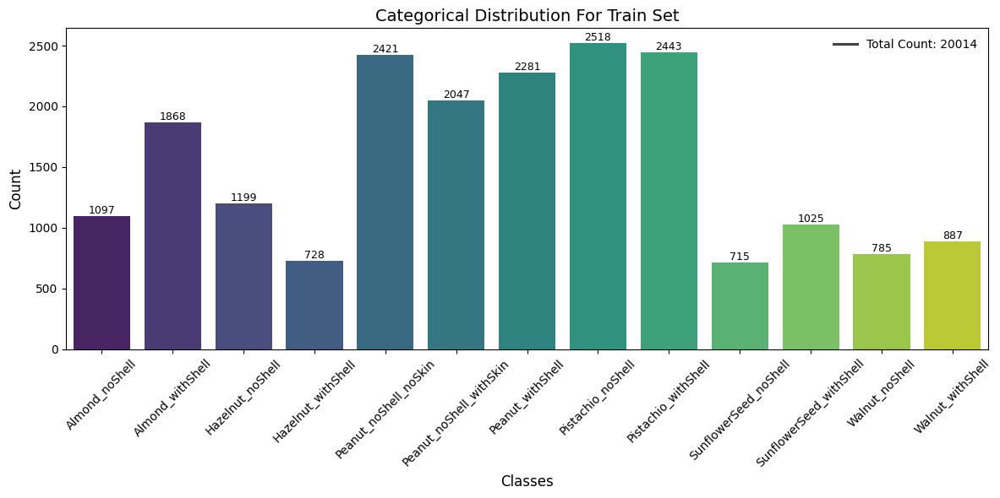

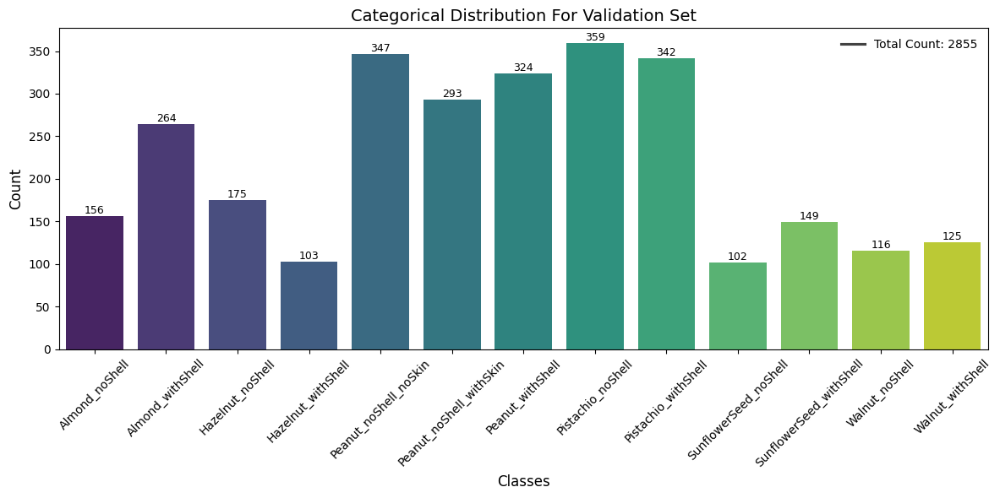

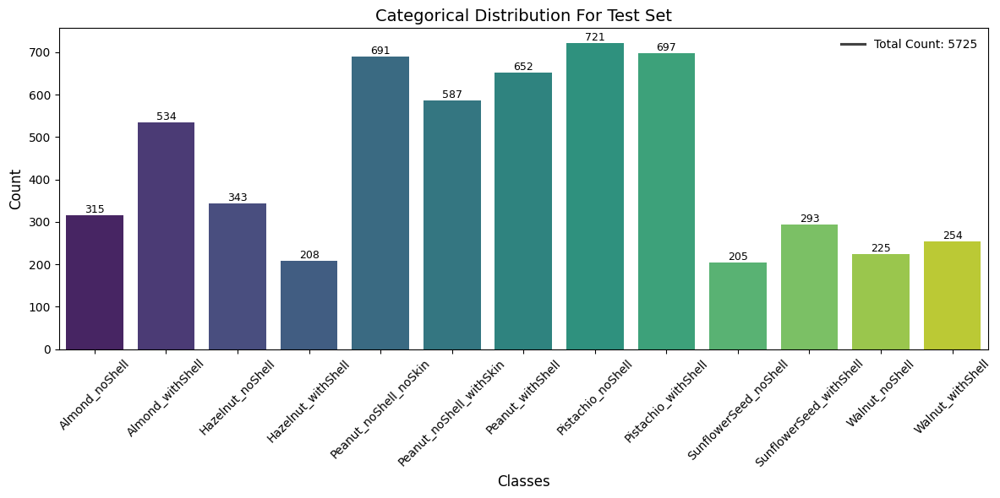

In [9]:
def extract_labels(generator):
    labels = []
    for _ in range(len(generator)):
        _, label_batch = next(generator)
        labels.extend(np.argmax(label_batch, axis=1))
    return labels

def plot_label_distribution(labels, title_name):
    reverse_labels        = {v: k for k, v in nut_labels.items()}
    title                 = "Categorical Distribution For " + title_name
    unique_labels, counts = np.unique(labels, return_counts=True)
    label_names_list      = [reverse_labels[label] for label in unique_labels]

    plt.figure(figsize=(12, 6))
    bars = sns.barplot(x=label_names_list, y=counts, palette="viridis")

    # Quantity
    for bar, count in zip(bars.patches, counts):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{count}',
            ha='center',
            va='bottom',
            fontsize=9
        )

    plt.title(title, fontsize=14)
    plt.xlabel("Classes", fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(rotation=45)

    # Legend
    total_count = np.sum(counts)
    plt.legend(
        [f"Total Count: {total_count}"],
        loc="upper right",
        frameon=False,
        fontsize=10
    )

    plt.tight_layout()
    plt.show()

# find labels
train_labels      = extract_labels(train_generator)
validation_labels = extract_labels(val_generator)
test_labels       = extract_labels(test_generator)

plot_label_distribution(train_labels, "Train Set")
plot_label_distribution(validation_labels, "Validation Set")
plot_label_distribution(test_labels, "Test Set")


In [10]:
def plot_pie_chart(labels, title_name):
    reverse_labels = {v: k for k, v in nut_labels.items()}
    unique_labels, counts = np.unique(labels, return_counts=True)
    label_names_list = [reverse_labels[label] for label in unique_labels]

    plt.figure(figsize=(8, 8))
    plt.pie(counts, labels=label_names_list, autopct='%1.1f%%', colors=sns.color_palette("viridis", len(counts)))
    plt.title(f"Pie Chart for {title_name}", fontsize=14)
    plt.show()

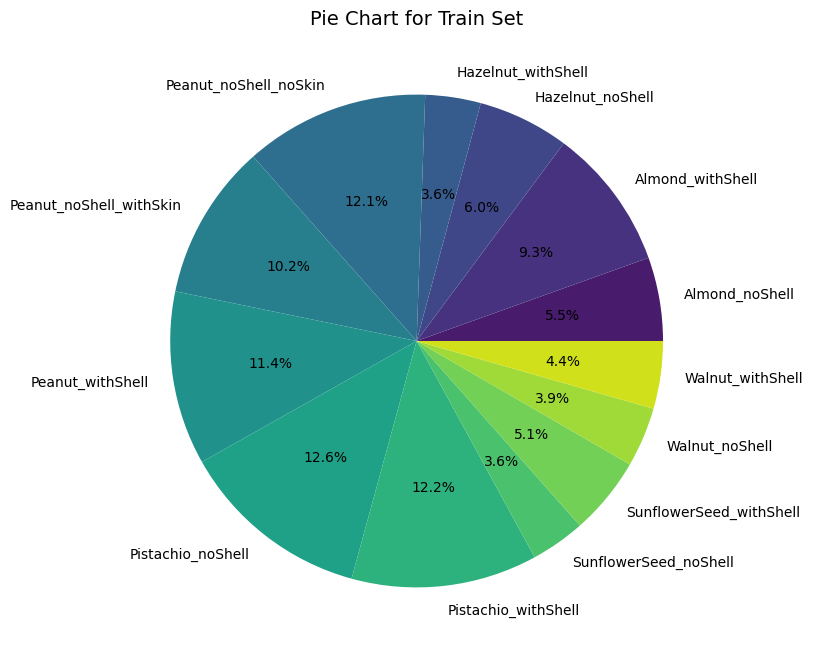

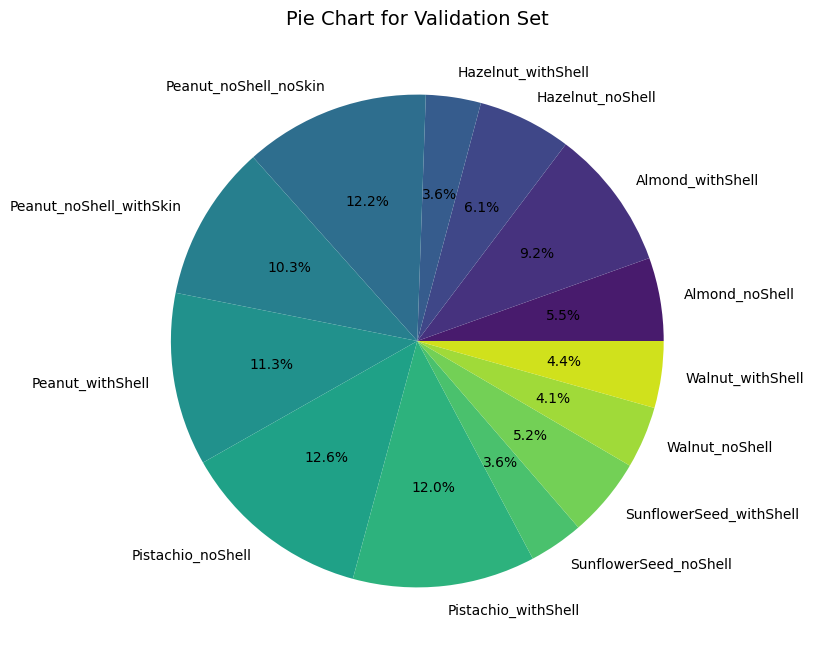

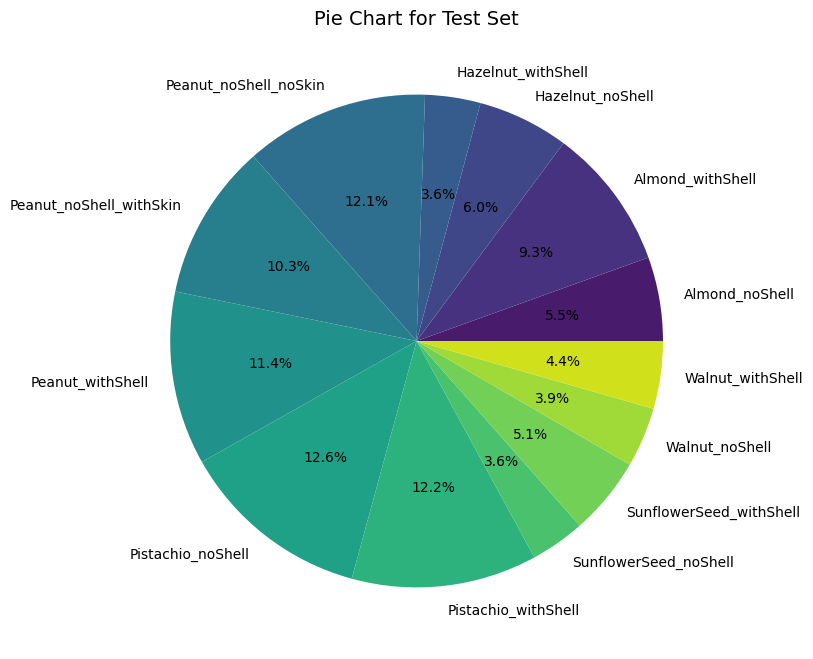

In [11]:
plot_pie_chart(train_labels, "Train Set")
plot_pie_chart(validation_labels, "Validation Set")
plot_pie_chart(test_labels, "Test Set")

## 3-) Modelling

In [12]:
model = Sequential()

#Convolution layer 1
model.add(Conv2D(filters=32,
                 kernel_size=(3,3),
                 padding="same",
                 input_shape=(240, 426, 3),
                 activation="relu"))
#Pooling Layer 1
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution layer 2
model.add(Conv2D(filters=64,
                 kernel_size=(3,3),
                 padding="same",
                 activation="relu"))
#Pooling Layer 2
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution layer 3
model.add(Conv2D(filters=128,
                 kernel_size=(3,3),
                 padding="same",
                 activation="relu"))
#Pooling Layer 3
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution layer 4
model.add(Conv2D(filters=128,
                 kernel_size=(3,3),
                 padding="same",
                 activation="relu"))
#Pooling Layer 4
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Flatten Layer
model.add(Flatten())
#Dense Layer
model.add(Dense(units=512,
                activation="relu"))
#Dropout Layer
model.add(Dropout(rate=0.2))
#Output Layer
model.add(Dense(units=13,
                activation="softmax"))

In [13]:
model.compile(loss      = "categorical_crossentropy",       #Use for more than 2 category.
              optimizer = "adam",                           #Better for multiple classes.
              metrics   = [tf.keras.metrics.Precision(),    #precission, recall, accuracy
                           tf.keras.metrics.Recall(),
                           "accuracy"])

In [14]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 240, 426, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 120, 213, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 120, 213, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 60, 106, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 106, 128)   │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 53, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 30, 53, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 15, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 49920)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    25,559,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 13)             │         6,669 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,807,053 (98.45 MB)

 Trainable params: 25,807,053 (98.45 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:
#To prevent Overfitting

callbacks = [EarlyStopping(monitor  = "val_loss", #Target Metric
                           patience = 15,         #Control every 15 epoch.
                           verbose  = 1,          #Show Information
                           mode     = "min"),     #Stop, if val_loss cannot decrease.
             #Save Best Model
             ModelCheckpoint(filepath           = "BestModel.keras", #name
                             monitor            = "val_loss",         #Target Metric
                             mode               = "min",              #Decrase
                             save_best_only     = True,               #Save best model
                             save_weights_only  = False),             #Save all model/Save only weights
             #Save Every 25 epoch
             ModelCheckpoint(filepath='model_epoch_{epoch:02d}.keras', #name
                            save_freq=25 * train_generator.samples // train_generator.batch_size)] #Save per 25 epoch

In [16]:
# Training the Model
history = model.fit(train_generator,                                                        #Train Set
                    epochs=200,                                                             #Train for 200 Epoch
                    callbacks=callbacks,                                                    #Early Stopping and ModelCheckPoints
                    validation_data=val_generator,                                          #Validation Set
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,  #Steps per epoch
                    validation_steps=val_generator.samples // val_generator.batch_size      #Steps per validation epoch
)

Epoch 1/200
312/312 ━━━━━━━━━━━━━━━━━━━━ 1031s 3s/step - accuracy: 0.1897 - loss: 2.2803 - precision: 0.4847 - recall: 0.0210 - val_accuracy: 0.2411 - val_loss: 2.2452 - val_precision: 0.4937 - val_recall: 0.0415
Epoch 2/200
312/312 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.3594 - loss: 1.8291 - precision: 0.8750 - recall: 0.2188 - val_accuracy: 0.2821 - val_loss: 2.4116 - val_precision: 1.0000 - val_recall: 0.0256
Epoch 3/200
312/312 ━━━━━━━━━━━━━━━━━━━━ 1000s 3s/step - accuracy: 0.4150 - loss: 1.6841 - precision: 0.6988 - recall: 0.1730 - val_accuracy: 0.4460 - val_loss: 1.5631 - val_precision: 0.6524 - val_recall: 0.2972
Epoch 4/200
312/312 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.5312 - loss: 1.0984 - precision: 0.7000 - recall: 0.3281 - val_accuracy: 0.5128 - val_loss: 1.5602 - val_precision: 0.5882 - val_recall: 0.2564
Epoch 5/200
312/312 ━━━━━━━━━━━━━━━━━━━━ 1026s 3s/step - accuracy: 0.5886 - loss: 1.1552 - precision: 0.7687 - recall: 0.4155 - val_accuracy: 0.5128 - v

## 4-) Model Evaluation

In [58]:
best_epoch = np.argmin(history.history['val_loss']) + 1  # +1 to adjust for zero-indexing
best_val_loss = min(history.history['val_loss'])
print(f"Best epoch: {best_epoch}")
print(f"Validation loss of Best Epoch: {best_val_loss:.4f}")


Best epoch: 12
Validation loss of Best Epoch: 0.6901


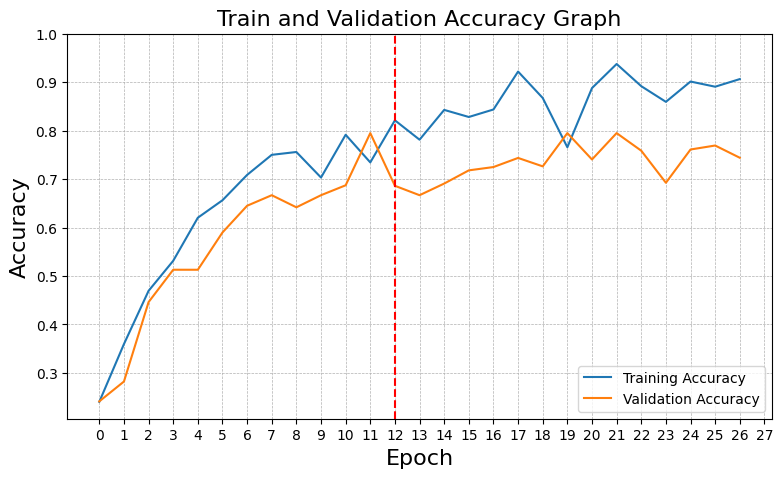

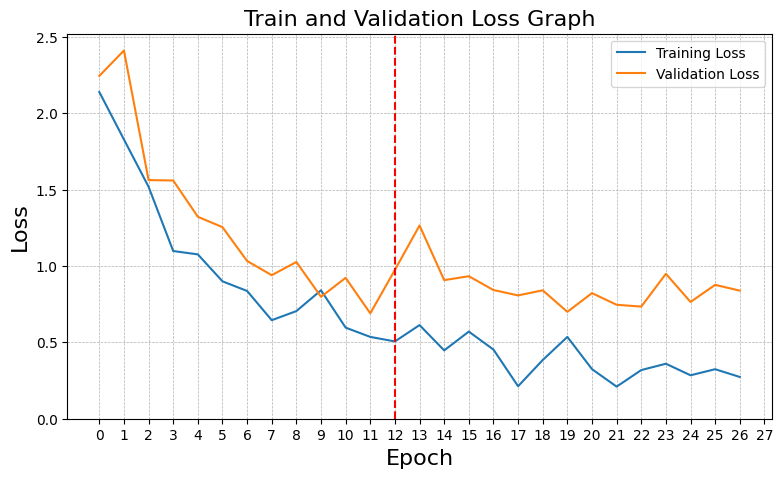

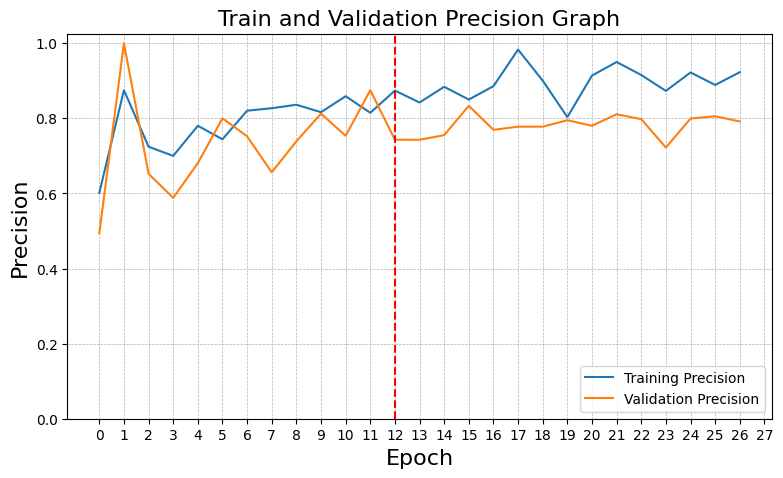

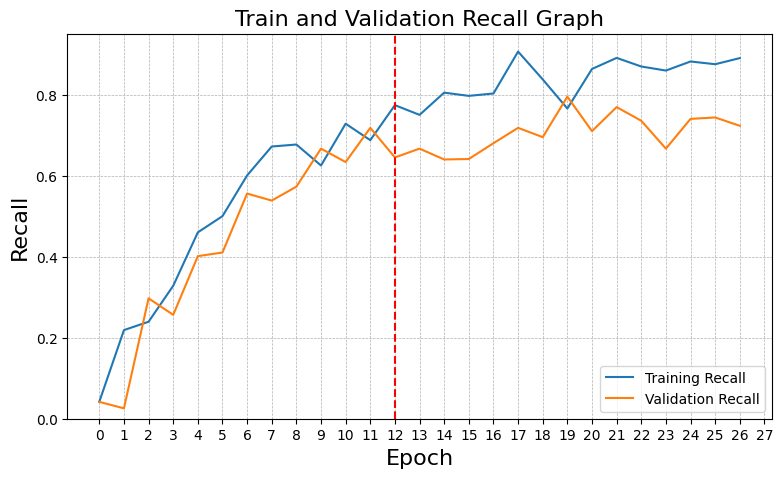

In [67]:
#------------------Epoch vs Accuracy------------------
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.legend(loc="lower right")
plt.axvline(x=12, color='r', linestyle='--', label='Epoch 12')
plt.xticks(range(0, 28))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Accuracy", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([min(plt.ylim()),1])
plt.title("Train and Validation Accuracy Graph", fontsize=16)
#------------------Epoch vs Loss------------------
plt.figure(figsize=(20,5))
plt.subplot(1,2,2)
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend(loc="upper right")
plt.axvline(x=12, color='r', linestyle='--', label='Epoch 12')
plt.xticks(range(0, 28))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Loss", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0,max(plt.ylim())])
plt.title("Train and Validation Loss Graph", fontsize=16)
plt.show()
#------------------Epoch vs Precision------------------
plt.figure(figsize=(20,5))
plt.subplot(1,2,2)
plt.plot(history.history["precision"], label="Training Precision")
plt.plot(history.history["val_precision"], label="Validation Precision")
plt.legend(loc="lower right")
plt.axvline(x=12, color='r', linestyle='--', label='Epoch 12')
plt.xticks(range(0, 28))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Precision", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0,max(plt.ylim())])
plt.title("Train and Validation Precision Graph", fontsize=16)
plt.show()
#------------------Epoch vs Recall------------------
plt.figure(figsize=(20,5))
plt.subplot(1,2,2)
plt.plot(history.history["recall"], label="Training Recall")
plt.plot(history.history["val_recall"], label="Validation Recall")
plt.legend(loc="lower right")
plt.axvline(x=12, color='r', linestyle='--', label='Epoch 12')
plt.xticks(range(0, 28))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Recall", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0,max(plt.ylim())])
plt.title("Train and Validation Recall Graph", fontsize=16)
plt.show()

In [70]:
#history_df = pd.DataFrame(history.history)
#history_df["Epoch"] = history_df.index+1
#history_df.to_csv("Model_Training_History.csv", index=False)
history_df = pd.read_csv("Model_Training_History.csv")
history_df

,accuracy,loss,precision,recall,val_accuracy,val_loss,val_precision,val_recall,Epoch
0,0.240150,2.140010,0.601439,0.041905,0.241122,2.245180,0.493671,0.041548,1
1,0.359375,1.829141,0.875000,0.218750,0.282051,2.411556,1.000000,0.025641,2
2,0.469273,1.519297,0.724405,0.239398,0.446023,1.563061,0.652377,0.297230,3
3,0.531250,1.098355,0.700000,0.328125,0.512821,1.560220,0.588235,0.256410,4
4,0.620201,1.076338,0.780224,0.460000,0.512784,1.322827,0.680723,0.401278,5
5,0.656250,0.899898,0.744186,0.500000,0.589744,1.254715,0.800000,0.410256,6
6,0.708571,0.836776,0.820379,0.600501,0.644886,1.032978,0.752042,0.555753,7
7,0.750000,0.645346,0.826923,0.671875,0.666667,0.940111,0.656250,0.538462,8
8,0.755840,0.704972,0.836192,0.676792,0.641690,1.026580,0.738891,0.572798,9
9,0.703125,0.841245,0.816327,0.625000,0.666667,0.798546,0.812500,0.666667,10


In [71]:
history_df.loc[history_df["Epoch"]==12]

,accuracy,loss,precision,recall,val_accuracy,val_loss,val_precision,val_recall,Epoch
11,0.734375,0.535818,0.814815,0.6875,0.794872,0.690099,0.875,0.717949,12


In [ ]:
# Load BestModel.keras:
from tensorflow.keras.models import load_model

# Load best model
best_model = load_model('BestModel.keras')

test_loss, test_precision, test_recall, test_accuracy = best_model.evaluate(test_generator, batch_size=64)
print("\nTest Accuracy: %.1f%%" % (100.0*test_accuracy))
print("\nTest Loss: %.1f%%" % (100.0*test_loss))
print("\nTest Precision: %.1f%%" % (100.0*test_precision))
print("\nTest Recall: %.1f%%" % (100.0*test_recall))

90/90 ━━━━━━━━━━━━━━━━━━━━ 51s 557ms/step - accuracy: 0.7707 - loss: 0.6018 - precision: 0.8232 - recall: 0.7282

Test Accuracy: 80.6%

Test Loss: 53.7%

Test Precision: 85.5%

Test Recall: 76.1%


In [9]:
y_pred = best_model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

90/90 ━━━━━━━━━━━━━━━━━━━━ 53s 588ms/step


In [10]:
# Classification report
print(classification_report(y_true, y_pred_classes, target_names=list(nut_labels.keys())))

                         precision    recall  f1-score   support

         Almond_noShell       0.86      0.81      0.83       315
       Almond_withShell       0.85      0.54      0.66       534
       Hazelnut_noShell       0.75      0.72      0.73       343
     Hazelnut_withShell       0.96      0.87      0.91       208
  Peanut_noShell_noSkin       0.81      0.92      0.86       691
Peanut_noShell_withSkin       0.88      0.89      0.89       587
       Peanut_withShell       0.55      0.91      0.69       652
      Pistachio_noShell       0.98      0.94      0.96       721
    Pistachio_withShell       0.73      0.68      0.71       697
  SunflowerSeed_noShell       0.84      0.69      0.76       205
SunflowerSeed_withShell       0.99      0.92      0.95       293
         Walnut_noShell       0.98      0.52      0.68       225
       Walnut_withShell       0.93      0.84      0.88       254

               accuracy                           0.81      5725
              macro avg

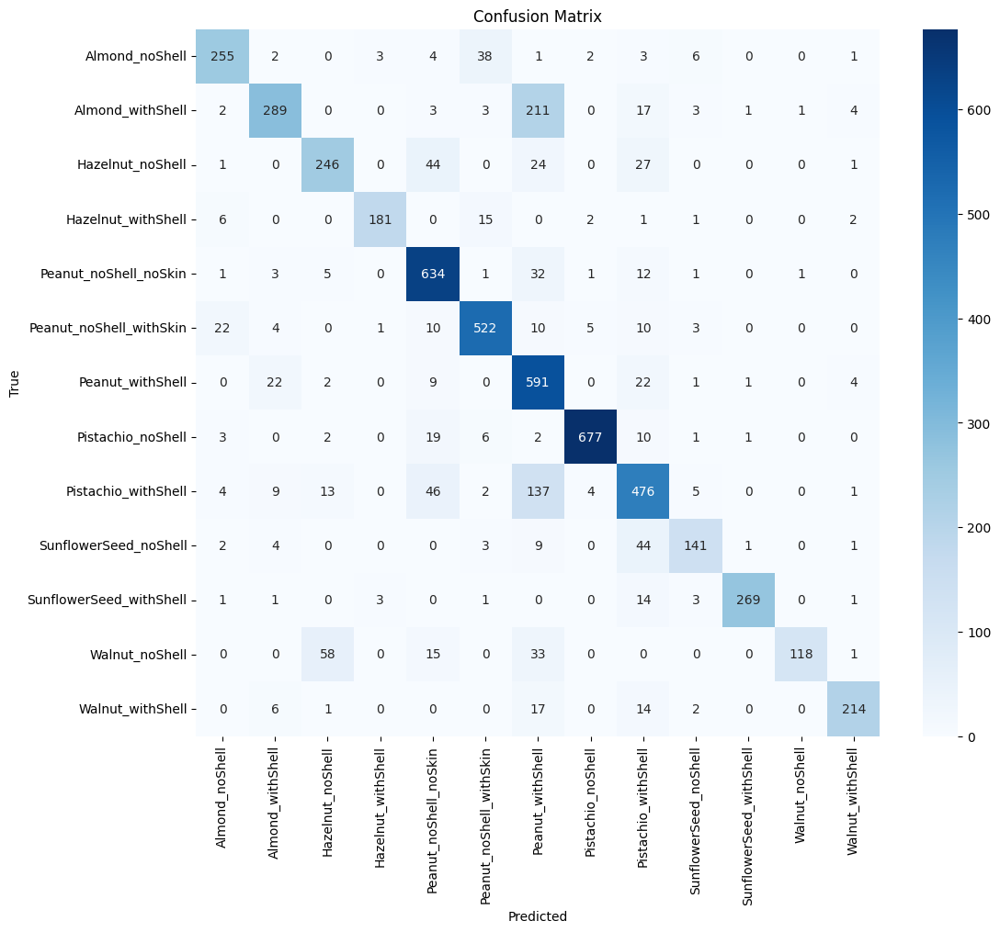

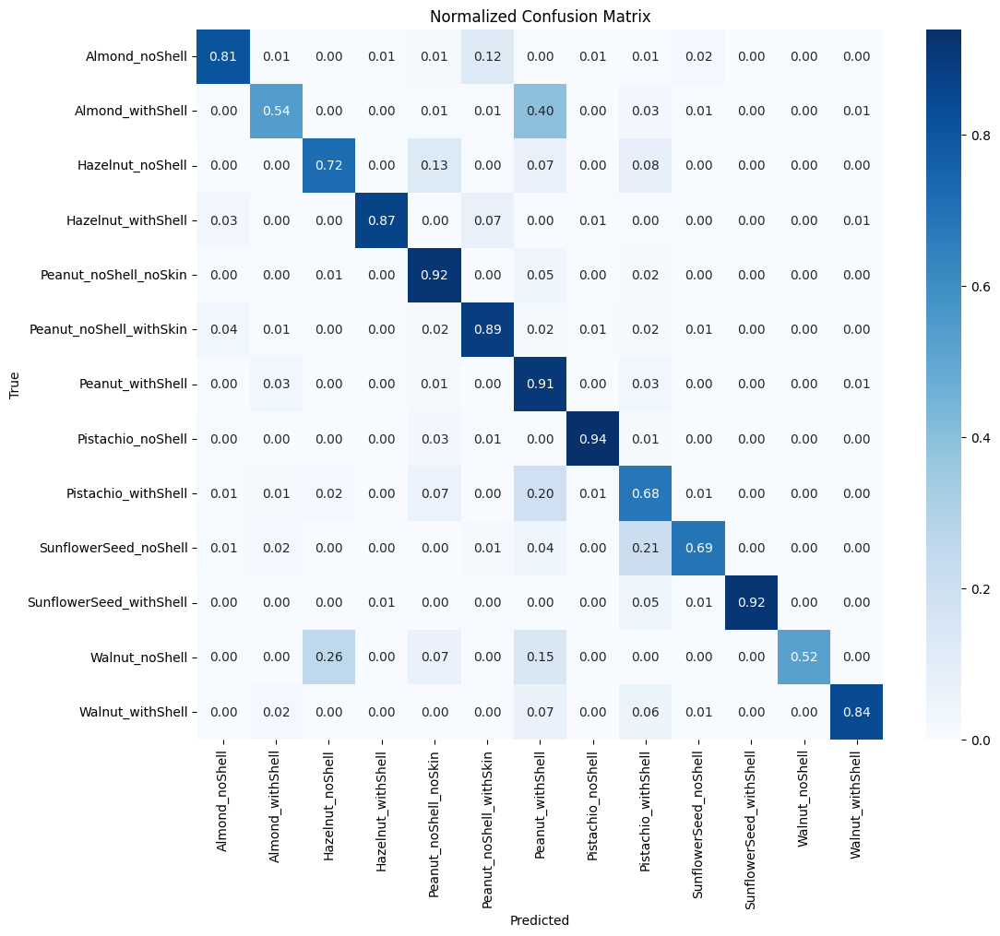

In [16]:
# Confision Matrix

conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Turn confisuon matrix into heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, 
            annot=True, 
            fmt='d', 
            cmap='Blues', 
            xticklabels=list(nut_labels.keys()), 
            yticklabels=list(nut_labels.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(12, 10)) 
sns.heatmap(conf_matrix_normalized, 
            annot=True, 
            fmt='.2f', 
            cmap='Blues', 
            xticklabels=list(nut_labels.keys()), 
            yticklabels=list(nut_labels.keys())) 
plt.title('Normalized Confusion Matrix') 
plt.xlabel('Predicted') 
plt.ylabel('True') 
plt.show()

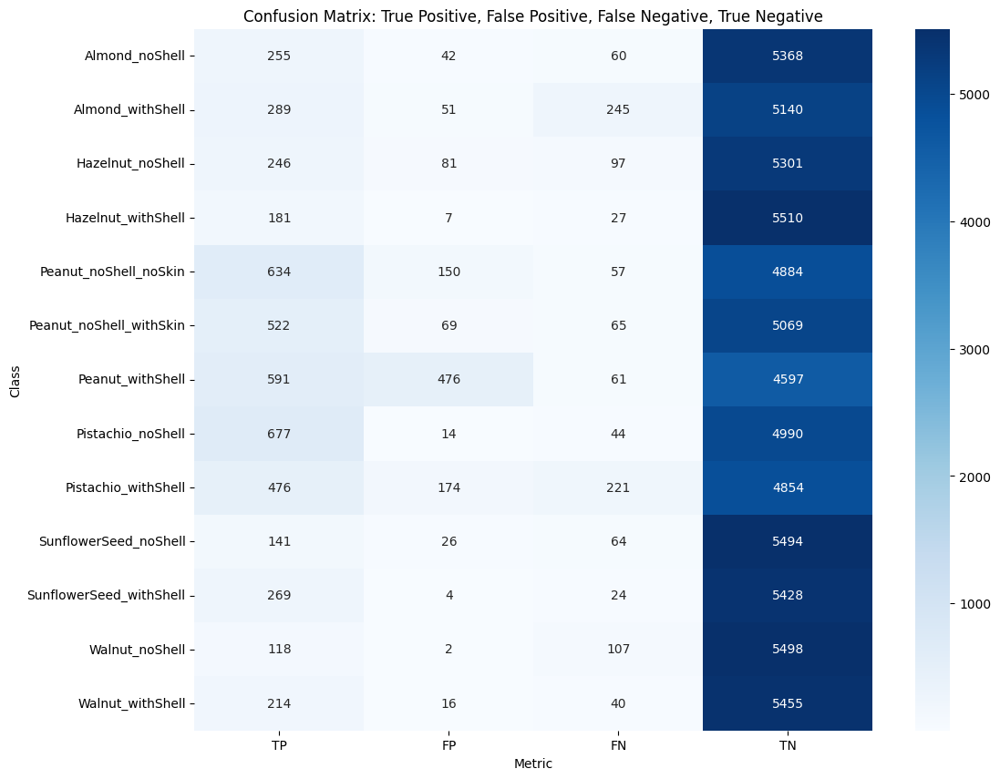

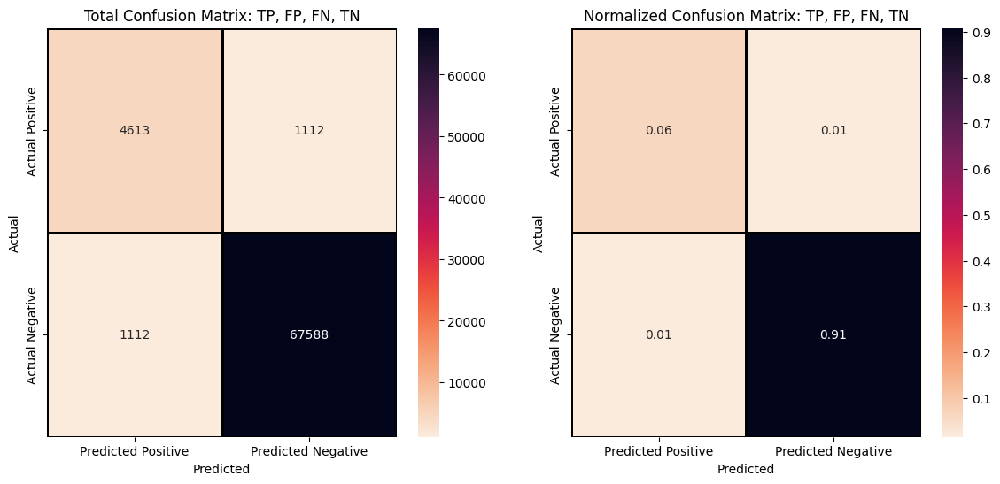

In [36]:
# number of classes
num_classes = conf_matrix.shape[0]

# Calculate TP, FP, FN, TN for every class
TP = np.diag(conf_matrix)
FP = conf_matrix.sum(axis=0) - TP
FN = conf_matrix.sum(axis=1) - TP
TN = conf_matrix.sum() - (FP + FN + TP)
matrix_data = np.vstack([TP, FP, FN, TN]).T

# Draw Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(matrix_data, 
            annot=True, 
            fmt='d', 
            cmap='Blues', 
            xticklabels=['TP', 'FP', 'FN', 'TN'], 
            yticklabels=list(nut_labels.keys()))
plt.title('Confusion Matrix: True Positive, False Positive, False Negative, True Negative')
plt.xlabel('Metric')
plt.ylabel('Class')
plt.show()

# Total TP, FP, FT, TN
total_TP = np.sum(TP)
total_FP = np.sum(FP)
total_FN = np.sum(FN)
total_TN = np.sum(TN)

total_matrix = np.array([[total_TP, total_FP], 
                         [total_FN, total_TN]]) 
#Normalization
total_sum = total_TP + total_FP + total_FN + total_TN 
normalized_matrix = total_matrix / total_sum 
# Heatmap for Total TP, FP, FT, TN 
plt.figure(figsize=(14, 6)) 
plt.subplot(1, 2, 1) 
sns.heatmap(total_matrix, 
            annot=True, 
            fmt='d',
            cmap='rocket_r',
            linewidths='1',
            linecolor='black', 
            xticklabels=['Predicted Positive', 'Predicted Negative'], 
            yticklabels=['Actual Positive', 'Actual Negative']) 
plt.title('Total Confusion Matrix: TP, FP, FN, TN') 
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
# Heatmap for Total TP, FP, FT, TN Normalization
plt.subplot(1, 2, 2) 
sns.heatmap(normalized_matrix, 
            annot=True, 
            fmt='.2f', 
            cmap='rocket_r',
            linewidths='1',
            linecolor='black',  
            xticklabels=['Predicted Positive', 'Predicted Negative'], 
            yticklabels=['Actual Positive', 'Actual Negative']) 
plt.title('Normalized Confusion Matrix: TP, FP, FN, TN') 
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
plt.show()

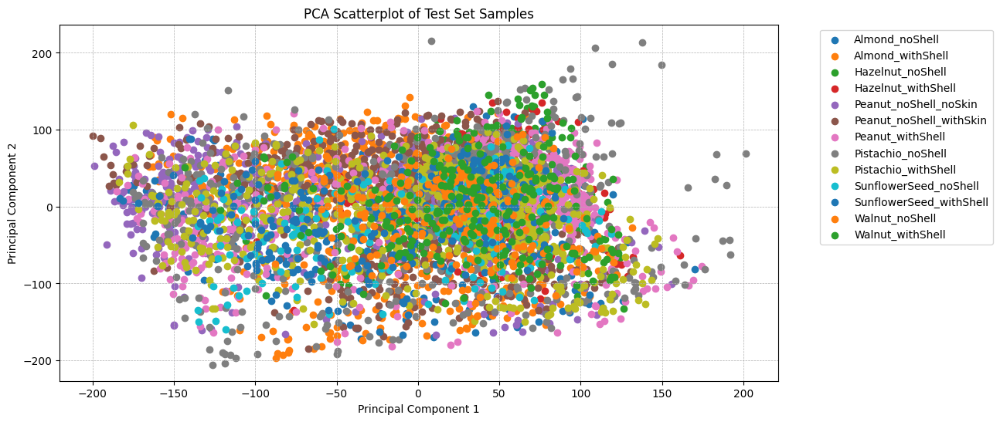

In [19]:
test_features = []
test_labels = []

# Collect all test set
for _ in range(len(test_generator)):
    features, labels = next(test_generator)
    test_features.append(features)
    test_labels.append(labels)

# turn lists into numpy array
test_features = np.vstack(test_features)
test_labels = np.vstack(test_labels)

# Flatten Test set
n_samples = test_features.shape[0]
data_flattened = test_features.reshape(n_samples, -1)  # Flatten

# PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_flattened)

# Draw Scatter plot
plt.figure(figsize=(12, 6))
for i in range(len(nut_labels)):
    indices = np.where(np.argmax(test_labels, axis=1) == i)
    plt.scatter(principal_components[indices, 0], principal_components[indices, 1], label=list(nut_labels.keys())[i])
plt.title('PCA Scatterplot of Test Set Samples')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 309ms/step


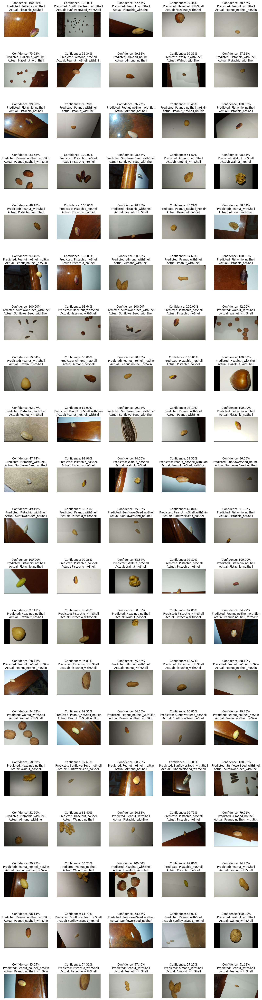

array([[[[0.6901961 , 0.63529414, 0.63529414],
         [0.6784314 , 0.62352943, 0.62352943],
         [0.6784314 , 0.6156863 , 0.61960787],
         ...,
         [0.78823537, 0.86666673, 0.8705883 ],
         [0.78823537, 0.86666673, 0.8705883 ],
         [0.78823537, 0.86666673, 0.8705883 ]],

        [[0.6862745 , 0.6313726 , 0.6313726 ],
         [0.6784314 , 0.62352943, 0.62352943],
         [0.6784314 , 0.6156863 , 0.61960787],
         ...,
         [0.78823537, 0.86666673, 0.8705883 ],
         [0.78823537, 0.86666673, 0.8705883 ],
         [0.78823537, 0.86666673, 0.8705883 ]],

        [[0.69411767, 0.6392157 , 0.6392157 ],
         [0.69411767, 0.6392157 , 0.6392157 ],
         [0.69411767, 0.6313726 , 0.63529414],
         ...,
         [0.78823537, 0.86666673, 0.8705883 ],
         [0.79215693, 0.8705883 , 0.8745099 ],
         [0.79215693, 0.8705883 , 0.8745099 ]],

        ...,

        [[0.5137255 , 0.30588236, 0.14901961],
         [0.5176471 , 0.30980393, 0.15294118]

In [33]:
def model_testing(test_generator, n, label_dict, model):
    # Collect all test set
    all_features = []
    all_labels   = []
    for _ in range(len(test_generator)):
        features, labels = next(test_generator)
        all_features.append(features)
        all_labels.append(labels)
    
    # turn lists into numpy array
    all_features = np.vstack(all_features)
    all_labels   = np.vstack(all_labels)
    
    # collect random sample
    indices           = random.sample(range(all_features.shape[0]), n)
    selected_features = all_features[indices]
    selected_labels   = all_labels[indices]

    # Get prediction
    predictions       = model.predict(selected_features)
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes      = np.argmax(selected_labels, axis=1)
    probabilities     = np.max(predictions, axis=1)

    # Visualize
    plt.figure(figsize=(20, 400))
    for i in range(n):
        img             = selected_features[i]
        predicted_class = predicted_classes[i]
        true_class      = true_classes[i]
        probability     = probabilities[i]
        predicted_label = list(label_dict.keys())[list(label_dict.values()).index(predicted_class)]
        true_label      = list(label_dict.keys())[list(label_dict.values()).index(true_class)]
        plt.subplot(100, 5, i + 1)
        plt.axis("off")
        plt.imshow(img.squeeze())
        plt.title(f"Confidence: {probability * 100:.2f}%\nPredicted: {predicted_label}\nActual: {true_label}")
    plt.show()
    return selected_features

model_testing(test_generator, 100, nut_labels, best_model)